## smFISH validation of astrocytes in the mouse brain

!pip install opencv-python
!pip install dask_image --upgrade
!pip install scikit-image --upgrade
!pip install imageio --upgrade

In [1]:
import glob
from dask_image.imread import imread
import cv2 as cv
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
#import cell2location

import sys
sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/BayraktarLab/cell2location/')
sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/cell2location_dev/')

In [2]:
# Load quantified data from segmentation maps
path_measurement = '/nfs/team283_imaging/VK_C2L/playground_Tong/ilastik/measurements/'

slide_id = 'VK_C2L_O14S_DAHN58.1d_Nucleus_Lgr6_Agt_Chl1_Angpt1_Meas1b_A1_F1T0'

angpt1_file = f'{slide_id}.ome_Alexa_647.csv'
lgr6_file = f'{slide_id}.ome_Alexa_488.csv'
agt_file = f'{slide_id}.ome_Alexa_568.csv'

agt = pd.read_csv(f'{path_measurement}{agt_file}', index_col='label')
angpt1 = pd.read_csv(f'{path_measurement}{angpt1_file}', index_col='label')
lgr6 = pd.read_csv(f'{path_measurement}{lgr6_file}', index_col='label')

In [3]:
agt['mean_intensity'].describe()

count    113186.000000
mean        343.755420
std         456.314132
min         120.496696
25%         161.149209
50%         187.652600
75%         257.140620
max        6079.188319
Name: mean_intensity, dtype: float64

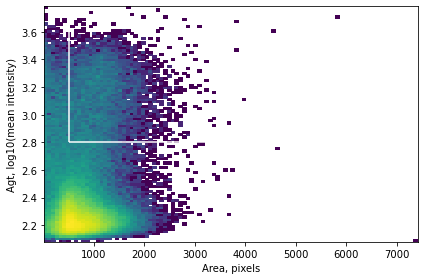

In [4]:
plt.hist2d(agt['area'].values, np.log10(agt['mean_intensity'].values), 
           bins = 100, norm=matplotlib.colors.LogNorm());
plt.xlabel('Area, pixels');
plt.ylabel('Agt, log10(mean intensity)');
plt.title('');
plt.tight_layout();
plt.hlines(2.8, 500, 7000, color='white');
plt.vlines(500, 2.8, 3.7, color='white');

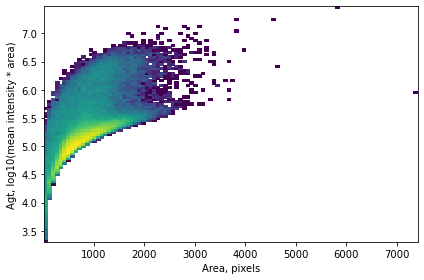

In [5]:
plt.hist2d(agt['area'].values, np.log10(agt['mean_intensity'].values * agt['area'].values), 
           bins = 100, norm=matplotlib.colors.LogNorm());
plt.xlabel('Area, pixels');
plt.ylabel('Agt, log10(mean intensity * area)');
plt.title('');
plt.tight_layout();
plt.hlines(2.8, 500, 7000, color='white');
plt.vlines(500, 2.8, 3.7, color='white');

In [6]:
agt = agt.loc[np.array(agt['area'] > 500) & np.array(np.log10(agt['mean_intensity'].values) > 2.8),:]
angpt1_all = angpt1.copy()
angpt1 = angpt1.loc[agt.index,:]
lgr6 = lgr6.loc[agt.index,:]

In [7]:
agt.to_csv(f'{path_measurement}filtered{agt_file}')

## Load raw images

In [8]:
# Load image data
paths_glob = ["/nfs/team283_imaging/0HarmonyStitched/VK_C2L/200917_182515-V__2020-09-17T18_38_24-Measurement 1b/",
    "/nfs/team283_imaging/0HarmonyStitched/JSP_HSS/200924_202612-V__2020-09-24T20_53_38-Measurement 1b/",
    "/nfs/team283_imaging/0HarmonyStitched/JSP_HSS/200924_221940-V__2020-09-24T22_46_54-Measurement 1b/"]
paths = glob.glob(f'{paths_glob[1]}*.ome.tif')

imgs = imread(f'{paths_glob[1]}{slide_id}.ome.tif')

In [9]:
paths

['/nfs/team283_imaging/0HarmonyStitched/JSP_HSS/200924_202612-V__2020-09-24T20_53_38-Measurement 1b/VK_C2L_O14S_DAHN58.1d_Nucleus_Lgr6_Agt_Chl1_Angpt1_Meas1b_A1_F3T0.ome.tif',
 '/nfs/team283_imaging/0HarmonyStitched/JSP_HSS/200924_202612-V__2020-09-24T20_53_38-Measurement 1b/VK_C2L_O14S_DAHN58.1d_Nucleus_Lgr6_Agt_Chl1_Angpt1_Meas1b_A1_F2T0.ome.tif',
 '/nfs/team283_imaging/0HarmonyStitched/JSP_HSS/200924_202612-V__2020-09-24T20_53_38-Measurement 1b/VK_C2L_O14S_DAHN58.1d_Nucleus_Lgr6_Agt_Chl1_Angpt1_Meas1b_A1_F1T0.ome.tif']

In [10]:
layer_num = 0
resize_factor = 1 / 10
new_dim = (np.array(imgs[layer_num].shape)[::-1] * resize_factor).astype(int)
img_layer_small = cv.resize(imgs[layer_num].compute(), (new_dim[0], new_dim[1]))
img_layer_small = np.clip(img_layer_small, 150, 500) # rescale intensities
img_layer = np.clip(imgs[layer_num].compute(), 150, 500) # rescale intensities

(array([6441533.,  217823.,  155641.,  119271.,   93959.,   74684.,
          60586.,   50013.,   40997.,  261807.]),
 array([150., 185., 220., 255., 290., 325., 360., 395., 430., 465., 500.]),
 <BarContainer object of 10 artists>)

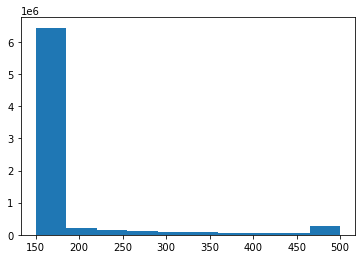

In [11]:
plt.hist(img_layer_small.flatten())

In [12]:
img_layer_small.shape

(2158, 3483)

## Load segmentation masks

In [13]:
from tqdm import tqdm
from matplotlib import pyplot as plt
import numpy as np
import tifffile #pip install tifffile

def color_tiff(img):
    img = img%60
    seg_color = np.zeros((*img.shape, 3), dtype=np.uint8)
    for i in tqdm(range(1, img.max()+1)):
        seg_color[img==i] = np.random.randint(0, 255, 3)
    return seg_color

masks_path = '/nfs/team283_imaging/VK_C2L/playground_Tong/masks/'
my_masks_path = '/nfs/team283_imaging/VK_C2L/playground_vitalii/masks/'

In [14]:
#! /usr/bin/env python
# -*- coding: utf-8 -*-
# vim:fenc=utf-8
#
# Copyright © 2020 Tong LI <tongli.bioinfo@protonmail.com>
#
# Distributed under terms of the BSD-3 license.

"""
Filter out labels that are not selected
"""
import argparse
import pandas as pd
import tifffile as tf
import numpy as np
from tqdm import tqdm
from scipy.ndimage import find_objects


def filter_mask_by_label(args):
    selected_labels = args['csv_in'].index.values
    print(selected_labels)
    label = tf.imread(args['label_in'])
    slices = find_objects(label)
    for i, bbox in enumerate(slices):
        cur_label = i + 1
        if cur_label not in selected_labels:
            if not bbox:
                continue
            label[bbox[0], bbox[1]] = 0
    assert len(np.unique(label)) - 1 == len(selected_labels)

    tf.imsave(args['label_out'], label, bigtiff=True)

filter_mask_by_label = '/nfs/team205/vk7/sanger_projects/cell2location_paper/code/filter_mask_by_label.py'
import os
os.system(f'{filter_mask_by_label} -label_in {masks_path}{slide_id}.ome_cyto_diam_35_assembled.tif -csv_in {path_measurement}filtered{agt_file}')

In [15]:
filter_mask_by_label({'csv_in': agt, 
                      'label_in': f'{masks_path}{slide_id}.ome_cyto_diam_35_assembled.tif',
                      'label_out': f'{my_masks_path}{slide_id}.ome_cyto_diam_35_assembled_selected.tif'})

[    26    409    431 ... 113329 113332 113350]


In [16]:
segm_img = tifffile.imread(f'{my_masks_path}{slide_id}.ome_cyto_diam_35_assembled_selected.tif')
colored_segm_img = color_tiff(segm_img)
#plt.imshow(colored_segm_img)
#plt.show()

100%|██████████| 59/59 [01:48<00:00,  1.84s/it]


In [17]:
def prepare_image(imgs, colored_segm_img=None, layer_num=0, alpha=0.5, 
                  resize_factor=None, rescale_intensities=(150, 500)):

    img_layer = imgs[layer_num].compute()
    img_layer = np.clip(img_layer, rescale_intensities[0], rescale_intensities[1]) # rescale intensities
    img_layer -= img_layer.min()

    # Get the color map by name:
    cm = plt.get_cmap('Greys_r')
    # Apply the colormap like a function to any array:
    img_layer = (cm(img_layer)[:, :, :3] * 255)

    if colored_segm_img is not None:
        binary_mask = np.zeros_like(img_layer)
        for i in range(img_layer.shape[2]):
            binary_mask[:, :, i] = segm_img > 0
        img_layer = img_layer * (1 - binary_mask) \
        + img_layer * binary_mask * alpha \
        + colored_segm_img * (1 - alpha)
    
    if resize_factor is not None:
        new_dim = (np.array(imgs[layer_num].shape)[::-1] * resize_factor).astype(int)
        img_layer = cv.resize(img_layer, (new_dim[0], new_dim[1]))
    
    return img_layer.astype(int)

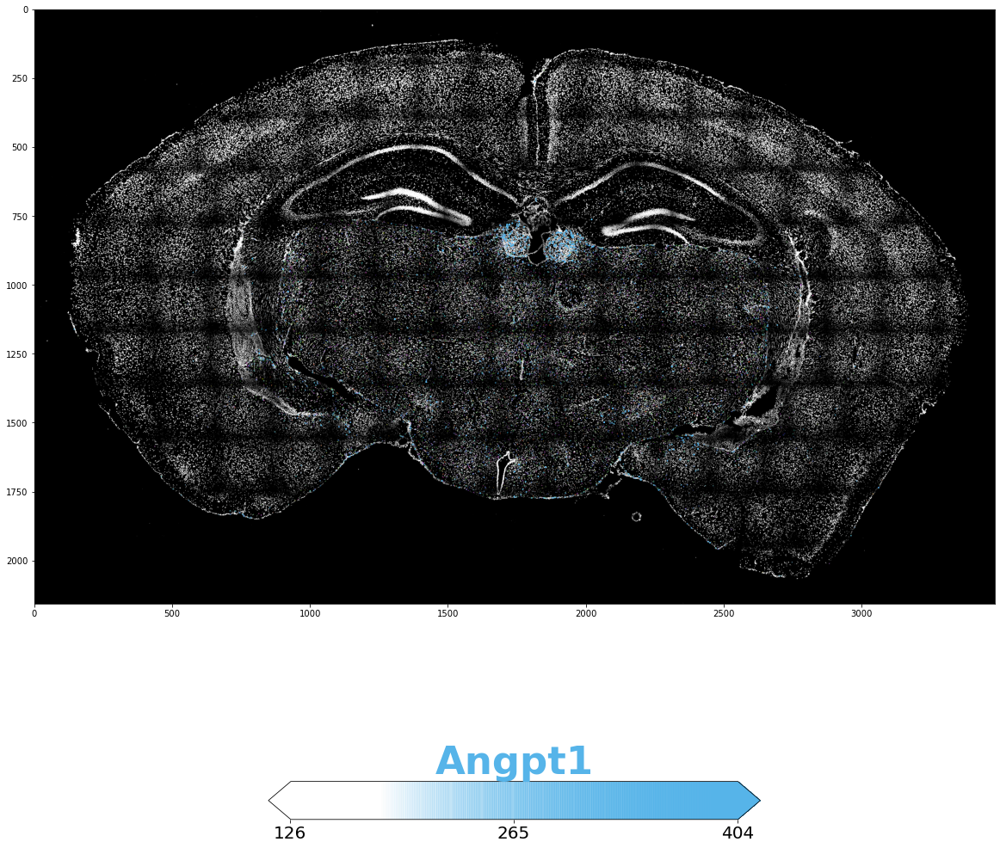

In [18]:
# Angpt1 in astros
from cell2location.plt.mapping_video import plot_spatial

img_layer_small = prepare_image(imgs, colored_segm_img=colored_segm_img, 
                                layer_num=0, alpha=0.5, 
                                resize_factor=resize_factor,
                                rescale_intensities=(150, 500))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(angpt1[['mean_intensity']], labels=['Angpt1'],
                  coords=angpt1[['centroid-1', 'centroid-0']].values * resize_factor, 
                  img=img_layer_small, show_img=True, img_alpha=1,
                  circle_diameter=1, alpha_scaling=1, reorder_cmap=[2, 0, 1],
                       plt_axis='on',
                  max_color_quantile=0.99, #image_cmap='Greys_r',
                  #crop_x=crop_x, crop_y=crop_y, axis_y_flipped=False,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

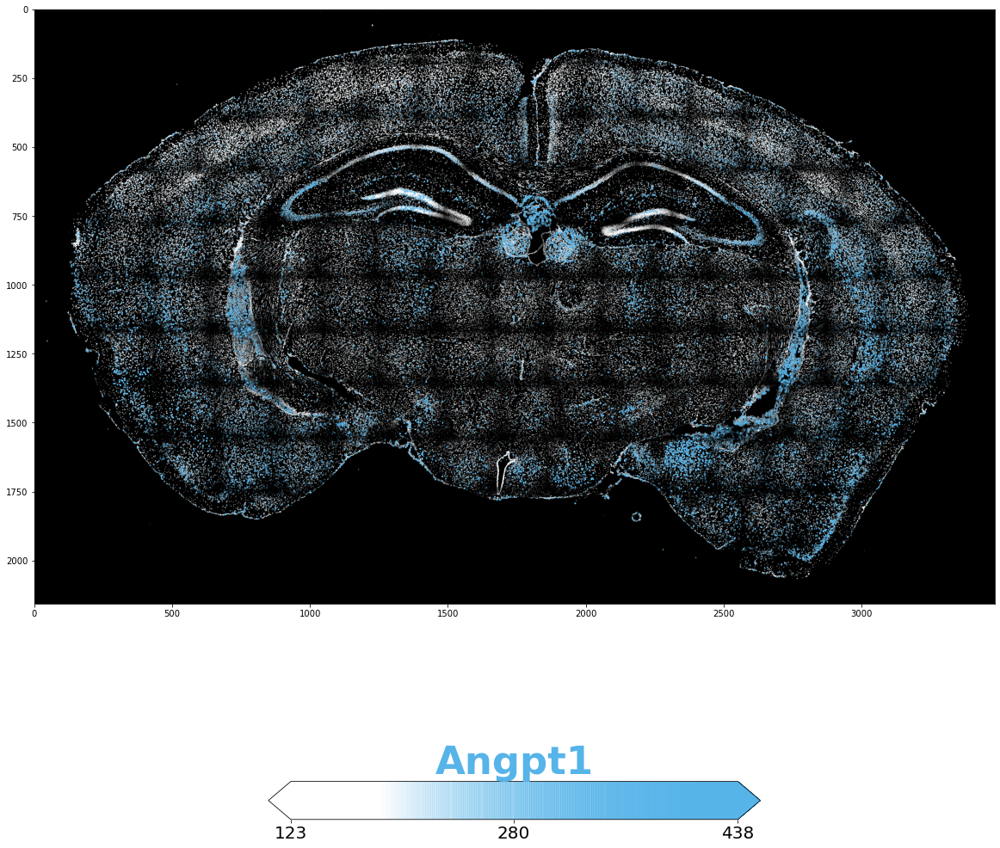

In [18]:
# Angpt1 in all cells
from cell2location.plt.mapping_video import plot_spatial

img_layer_small = prepare_image(imgs, colored_segm_img=None, 
                                layer_num=0, alpha=0.5, 
                                resize_factor=resize_factor,
                                rescale_intensities=(150, 500))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(angpt1_all[['mean_intensity']], labels=['Angpt1'],
                  coords=angpt1_all[['centroid-1', 'centroid-0']].values * resize_factor, 
                  img=img_layer_small, show_img=True, img_alpha=1,
                  circle_diameter=1, alpha_scaling=1, reorder_cmap=[2, 0, 1],
                       plt_axis='on',
                  max_color_quantile=0.99, image_cmap='Greys_r',
                  #crop_x=crop_x, crop_y=crop_y, axis_y_flipped=False,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

In [ ]:
# lgr6 in astros
from cell2location.plt.mapping_video import plot_spatial

img_layer_small = prepare_image(imgs, colored_segm_img=colored_segm_img, 
                                layer_num=0, alpha=0.5, 
                                resize_factor=resize_factor,
                                rescale_intensities=(150, 500))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(lgr6[['mean_intensity']], labels=['lgr6'],
                  coords=lgr6[['centroid-1', 'centroid-0']].values * resize_factor, 
                  img=img_layer_small, show_img=True, img_alpha=1,
                  circle_diameter=1, alpha_scaling=1, reorder_cmap=[2, 0, 1],
                       plt_axis='on',
                  max_color_quantile=0.99, #image_cmap='Greys_r',
                  #crop_x=crop_x, crop_y=crop_y, axis_y_flipped=False,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

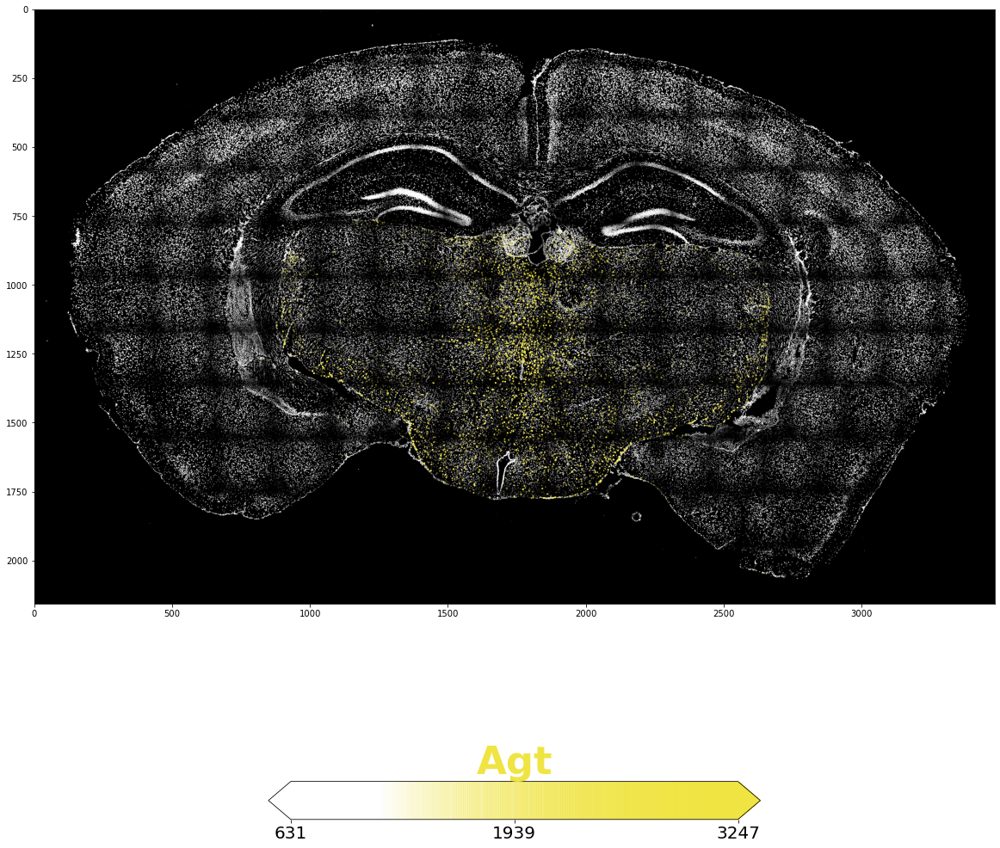

In [19]:
from cell2location.plt.mapping_video import plot_spatial

img_layer_small = prepare_image(imgs, colored_segm_img=None, 
                                layer_num=0, alpha=0.5, 
                                resize_factor=resize_factor,
                                rescale_intensities=(150, 500))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(agt[['mean_intensity']], labels=['Agt'],
                  coords=agt[['centroid-1', 'centroid-0']].values * resize_factor, 
                  img=img_layer_small, show_img=True, img_alpha=1,
                  circle_diameter=1, alpha_scaling=1, reorder_cmap=[0, 1],
                       plt_axis='on',
                  max_color_quantile=0.98, image_cmap='Greys_r',
                  #crop_x=crop_x, crop_y=crop_y, axis_y_flipped=False,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

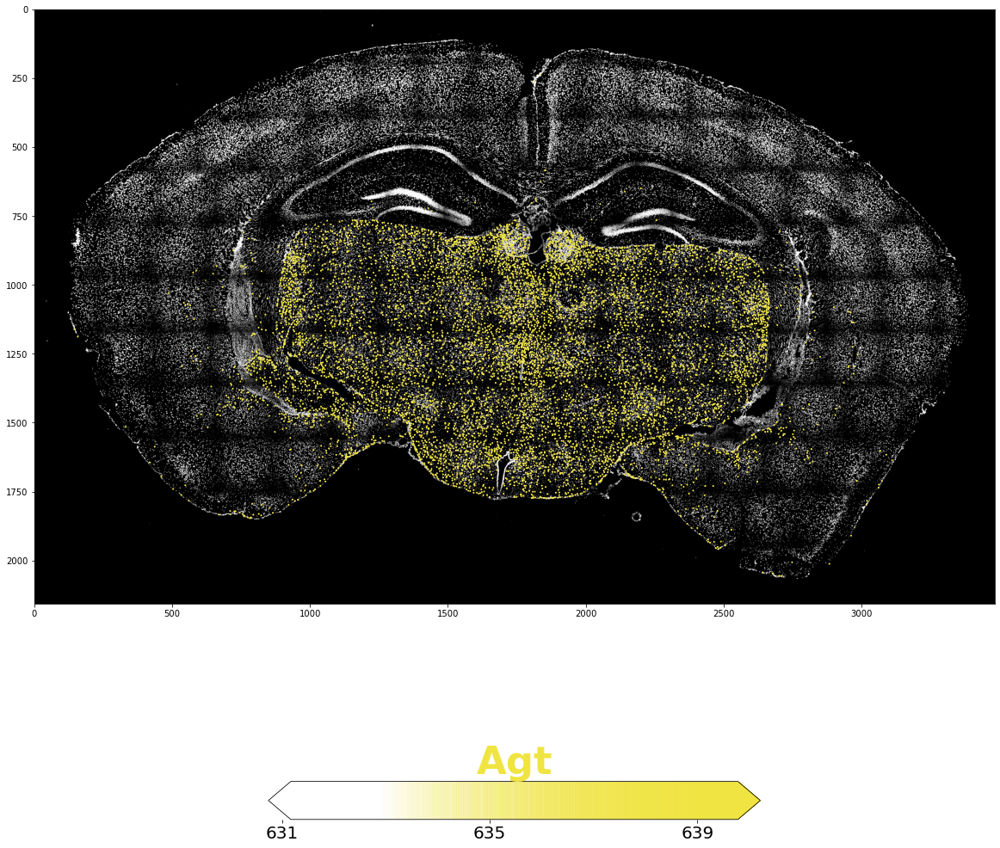

In [20]:
from cell2location.plt.mapping_video import plot_spatial

img_layer_small = prepare_image(imgs, colored_segm_img=None, 
                                layer_num=0, alpha=0.5, 
                                resize_factor=resize_factor,
                                rescale_intensities=(150, 500))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(agt[['mean_intensity']], labels=['Agt'],
                  coords=agt[['centroid-1', 'centroid-0']].values * resize_factor, 
                  img=img_layer_small, show_img=True, img_alpha=1,
                  circle_diameter=1, alpha_scaling=1, reorder_cmap=[0, 1],
                       plt_axis='on',
                  max_color_quantile=0.01, image_cmap='Greys_r',
                  #crop_x=crop_x, crop_y=crop_y, axis_y_flipped=False,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

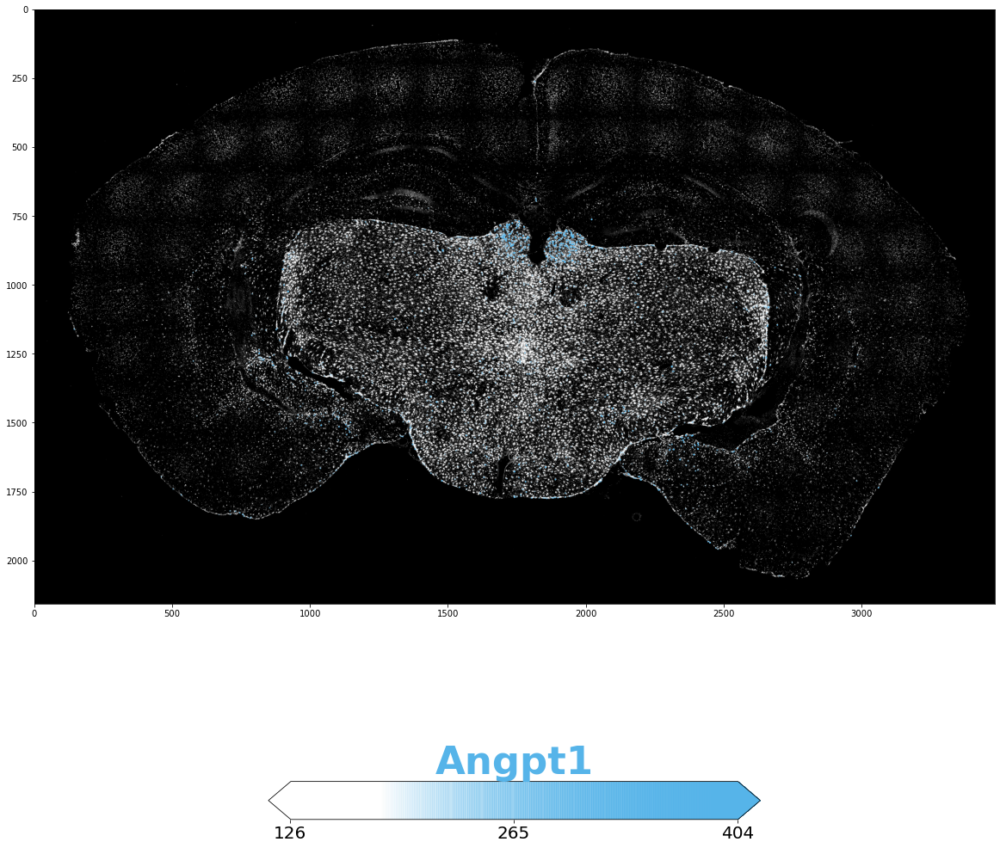

In [21]:
from cell2location.plt.mapping_video import plot_spatial

img_layer_small = prepare_image(imgs, colored_segm_img=None, 
                                layer_num=2, alpha=0.5, 
                                resize_factor=resize_factor,
                                rescale_intensities=(150, 500))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(angpt1[['mean_intensity']], labels=['Angpt1'],
                  coords=angpt1[['centroid-1', 'centroid-0']].values * resize_factor, 
                  img=img_layer_small, show_img=True, img_alpha=1,
                  circle_diameter=1, alpha_scaling=1, reorder_cmap=[2, 0, 1],
                       plt_axis='on',
                  max_color_quantile=0.99, image_cmap='Greys_r',
                  #crop_x=crop_x, crop_y=crop_y, axis_y_flipped=False,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

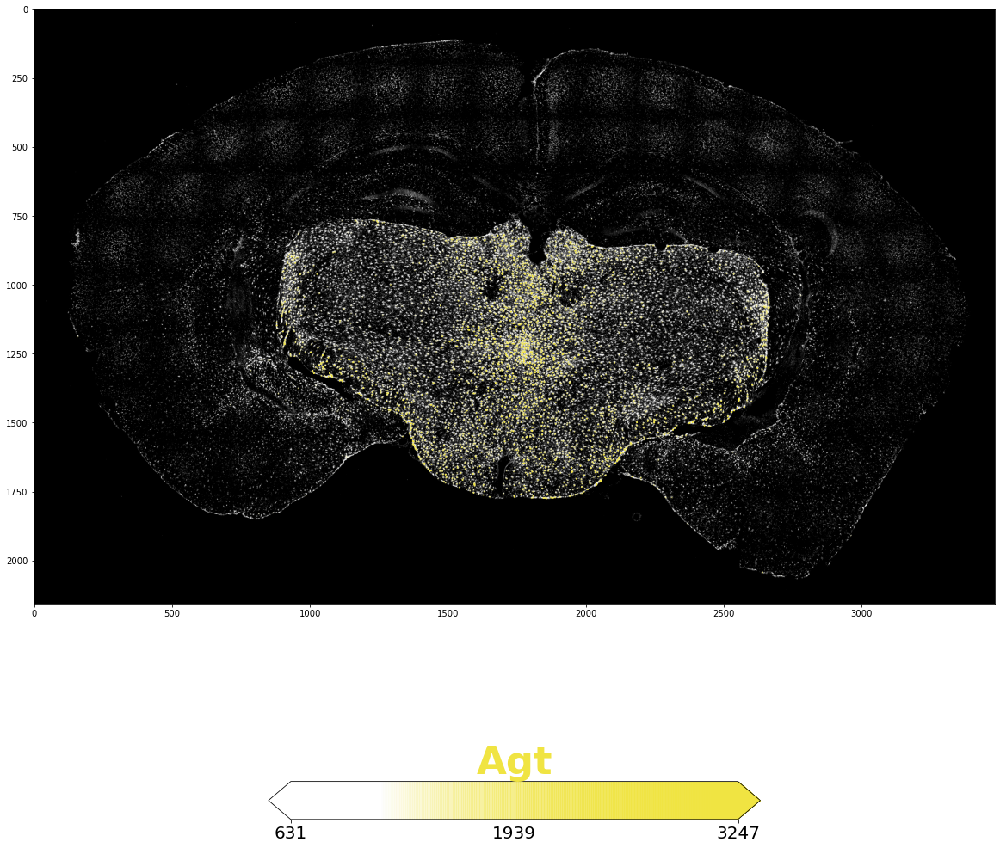

In [22]:
from cell2location.plt.mapping_video import plot_spatial

img_layer_small = prepare_image(imgs, colored_segm_img=None, 
                                layer_num=2, alpha=0.5, 
                                resize_factor=resize_factor,
                                rescale_intensities=(150, 500))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(agt[['mean_intensity']], labels=['Agt'],
                  coords=agt[['centroid-1', 'centroid-0']].values * resize_factor, 
                  img=img_layer_small, show_img=True, img_alpha=1,
                  circle_diameter=1, alpha_scaling=1, reorder_cmap=[0, 1],
                       plt_axis='on',
                  max_color_quantile=0.98, image_cmap='Greys_r',
                  #crop_x=crop_x, crop_y=crop_y, axis_y_flipped=False,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

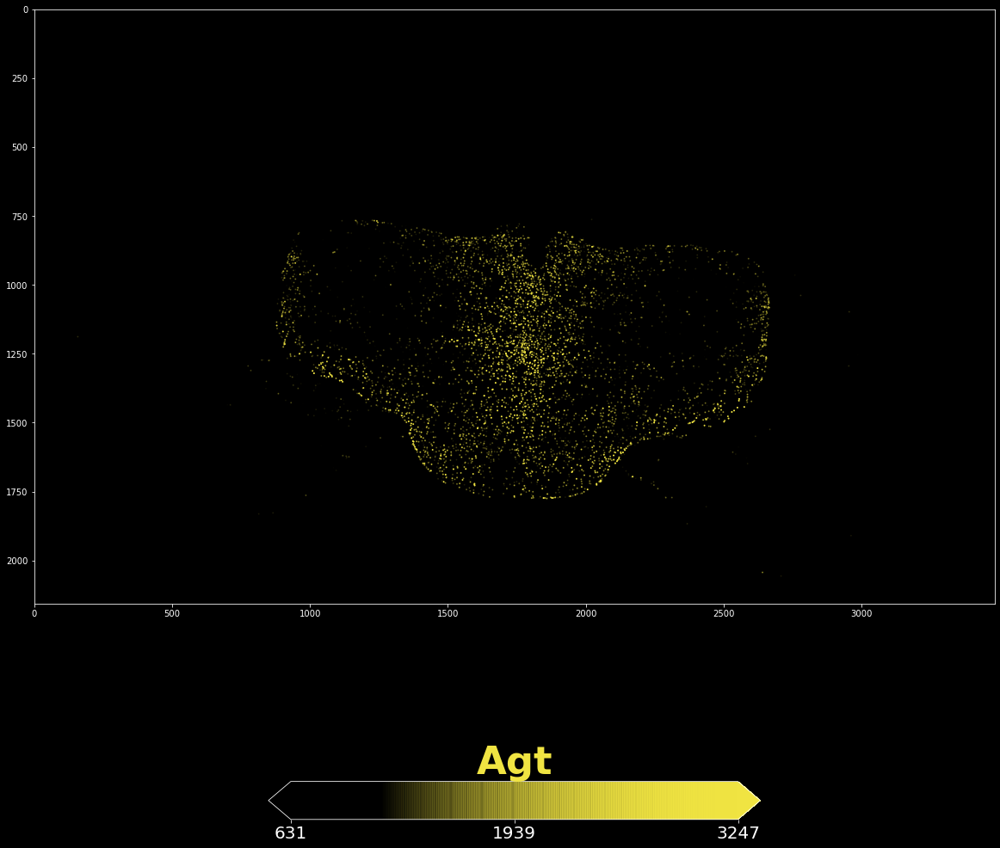

In [23]:
from cell2location.plt.mapping_video import plot_spatial

img_layer_small = prepare_image(imgs, colored_segm_img=None, 
                                layer_num=2, alpha=0.5, 
                                resize_factor=resize_factor,
                                rescale_intensities=(150, 500))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(agt[['mean_intensity']], labels=['Agt'],
                  coords=agt[['centroid-1', 'centroid-0']].values * resize_factor, 
                  img=img_layer_small, show_img=True, img_alpha=0,
                  circle_diameter=1, alpha_scaling=1, reorder_cmap=[0, 1],
                       plt_axis='on', style='dark_background',
                  max_color_quantile=0.98, image_cmap='Greys_r',
                  #crop_x=crop_x, crop_y=crop_y, axis_y_flipped=False,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

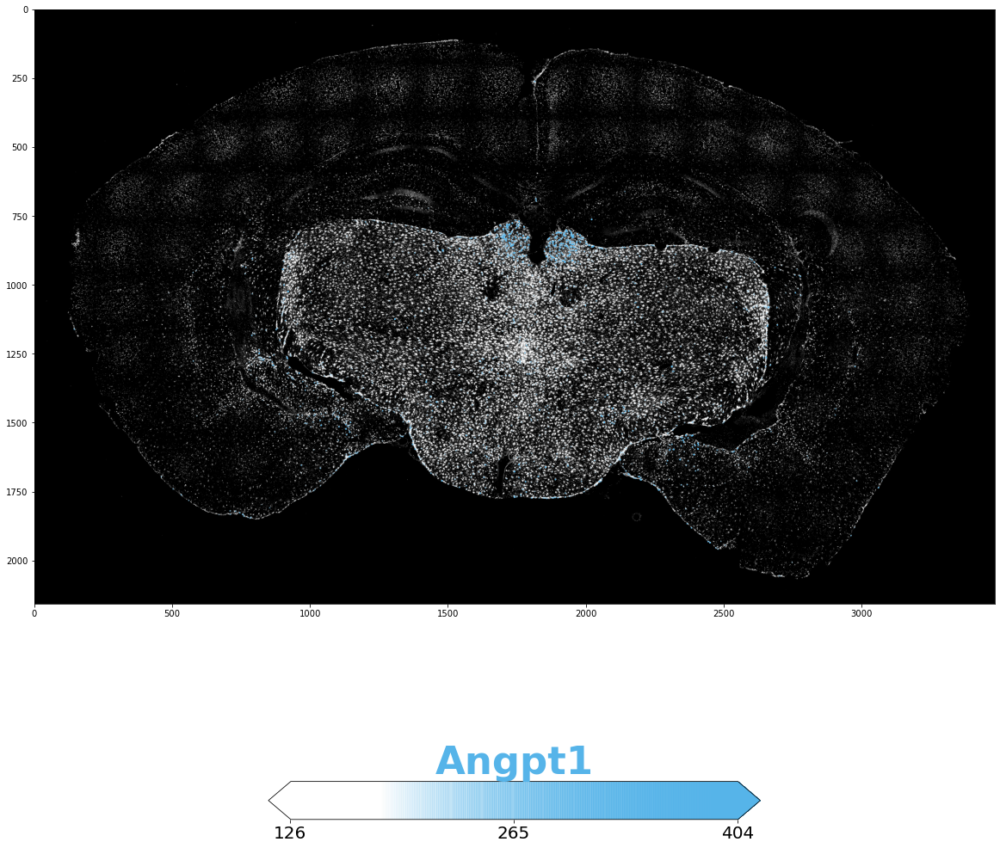

In [24]:
from cell2location.plt.mapping_video import plot_spatial

img_layer_small = prepare_image(imgs, colored_segm_img=None, 
                                layer_num=2, alpha=0.5, 
                                resize_factor=resize_factor,
                                rescale_intensities=(150, 500))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(angpt1[['mean_intensity']], labels=['Angpt1'],
                  coords=angpt1[['centroid-1', 'centroid-0']].values * resize_factor, 
                  img=img_layer_small, show_img=True, img_alpha=1,
                  circle_diameter=1, alpha_scaling=1, reorder_cmap=[2, 0, 1],
                       plt_axis='on',
                  max_color_quantile=0.99, image_cmap='Greys_r',
                  #crop_x=crop_x, crop_y=crop_y, axis_y_flipped=False,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

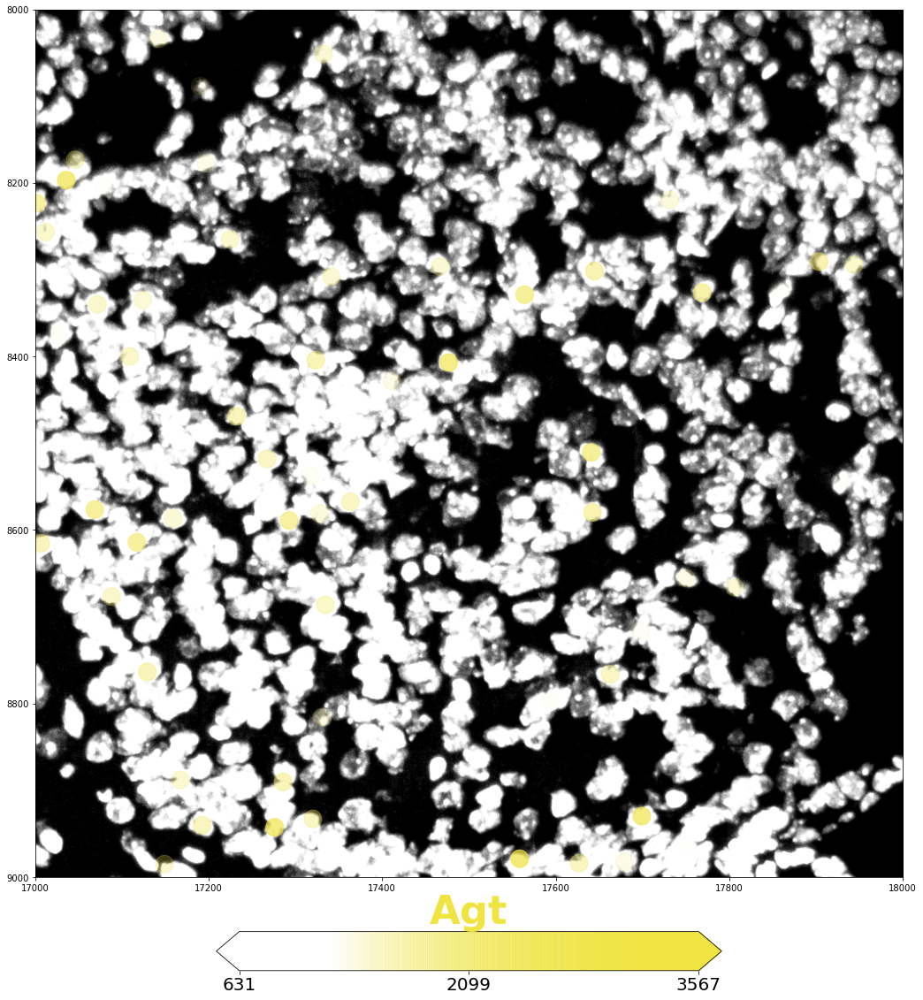

In [25]:
from cell2location.plt.mapping_video import plot_spatial

img_layer = prepare_image(imgs, colored_segm_img=None, 
                                layer_num=0, alpha=0.5, 
                                resize_factor=None,
                                rescale_intensities=(150, 1000))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(agt[['mean_intensity']], labels=['Agt'],
                  coords=agt[['centroid-1', 'centroid-0']].values, 
                  img=img_layer, show_img=True, img_alpha=1,
                  circle_diameter=20, alpha_scaling=1, reorder_cmap=[0, 1],
                       plt_axis='on',
                  max_color_quantile=0.01, image_cmap='Greys_r',
                  crop_x=[1700 / resize_factor, 1800 / resize_factor], 
                  crop_y=[800 / resize_factor, 900 / resize_factor], 
                       axis_y_flipped=True,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

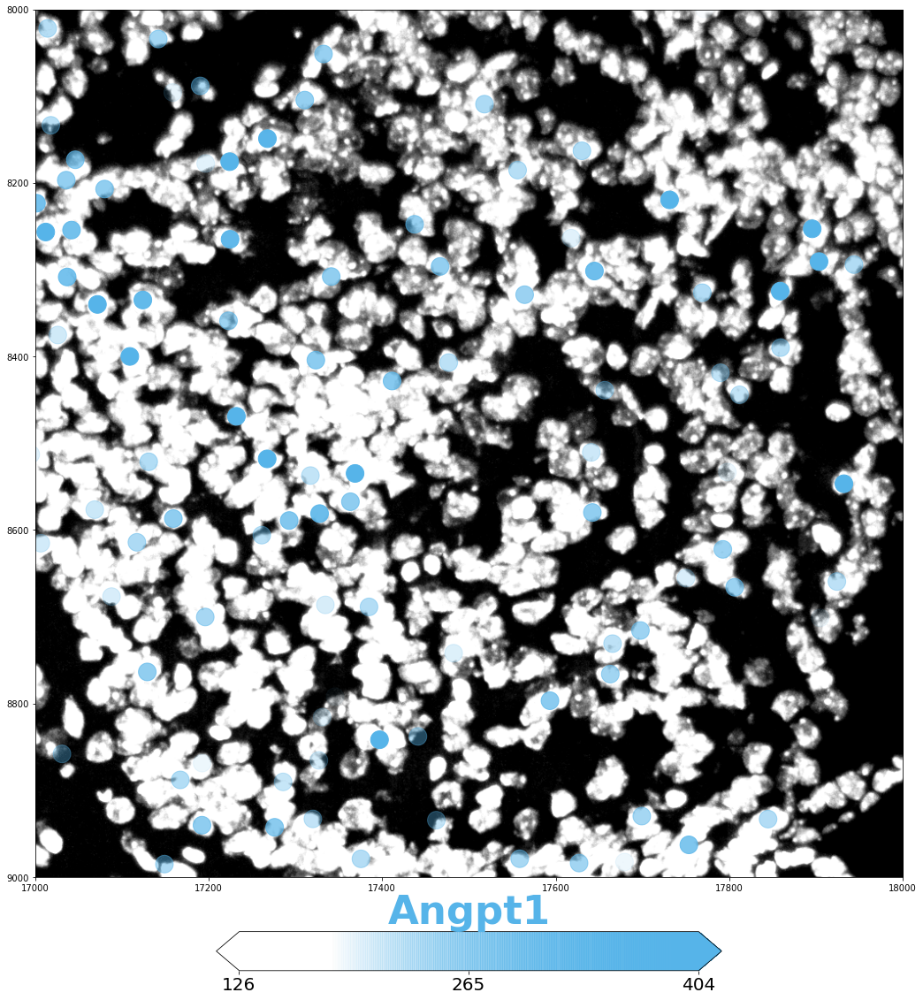

In [26]:
from cell2location.plt.mapping_video import plot_spatial

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(angpt1[['mean_intensity']], labels=['Angpt1'],
                  coords=angpt1[['centroid-1', 'centroid-0']].values, 
                  img=img_layer, show_img=True, img_alpha=1,
                  circle_diameter=20, alpha_scaling=1, reorder_cmap=[2, 0, 1],
                       plt_axis='on',
                  max_color_quantile=0.99, image_cmap='Greys_r',
                  crop_x=[1700 / resize_factor, 1800 / resize_factor], 
                  crop_y=[800 / resize_factor, 900 / resize_factor], 
                       axis_y_flipped=True,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

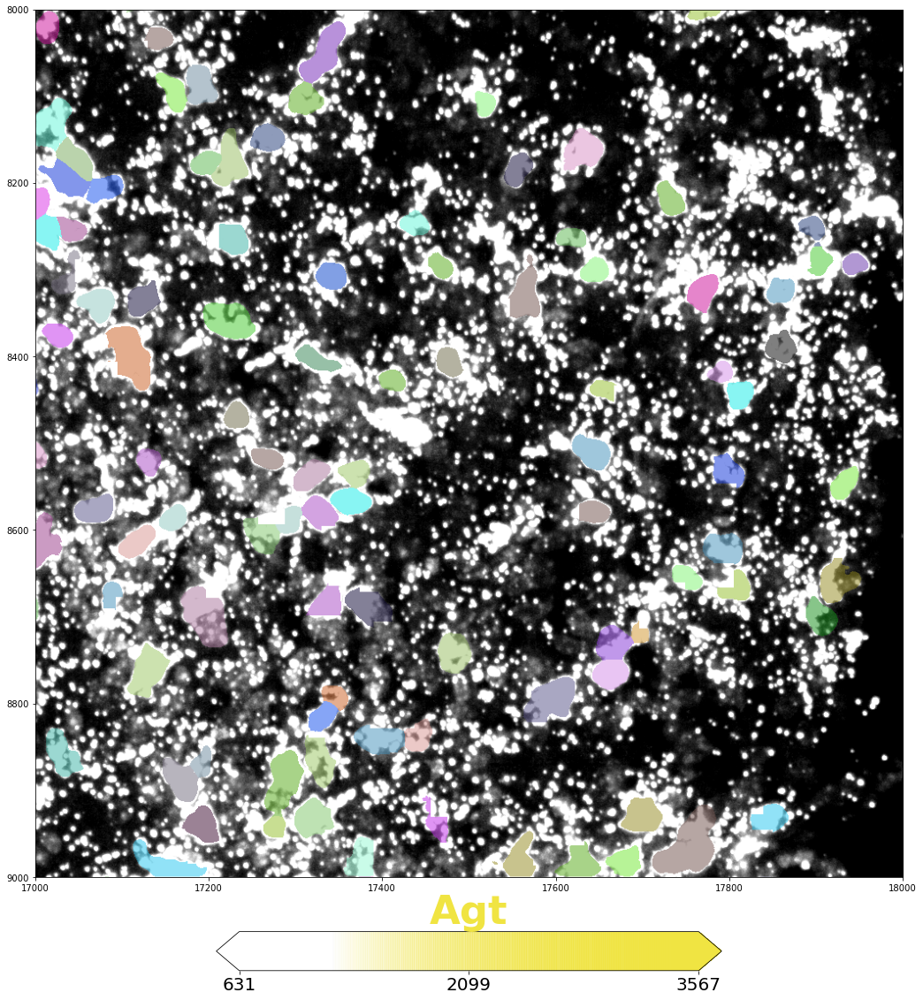

In [21]:
from cell2location.plt.mapping_video import plot_spatial

img_layer_agt = prepare_image(imgs, colored_segm_img=colored_segm_img, 
                                layer_num=2, alpha=0.5, 
                                resize_factor=None,
                                rescale_intensities=(150, 1000))

from PIL import Image
Image.fromarray(img_layer_agt.astype(np.uint8)).save(
    f'{my_masks_path}{slide_id}.ome_cyto_diam_35_assembled_selected_overlay.png'
)

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(agt[['mean_intensity']], labels=['Agt'],
                  coords=agt[['centroid-1', 'centroid-0']].values, 
                  img=img_layer_agt, show_img=True, img_alpha=1,
                  circle_diameter=20, alpha_scaling=0, reorder_cmap=[0, 1],
                       plt_axis='on',
                  max_color_quantile=0.99, image_cmap='Greys_r',
                  crop_x=[1700 / resize_factor, 1800 / resize_factor], 
                  crop_y=[800 / resize_factor, 900 / resize_factor], 
                       axis_y_flipped=True,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

In [22]:
from PIL import Image
Image.fromarray(img_layer_agt.astype(np.uint8)).save(
    f'{my_masks_path}{slide_id}.ome_cyto_diam_35_assembled_selected_overlay.png'
)
from PIL import Image
Image.fromarray(img_layer_agt.astype(np.uint8)).save(
    f'{my_masks_path}{slide_id}.ome_cyto_diam_35_assembled_selected_overlay.jpg'
)


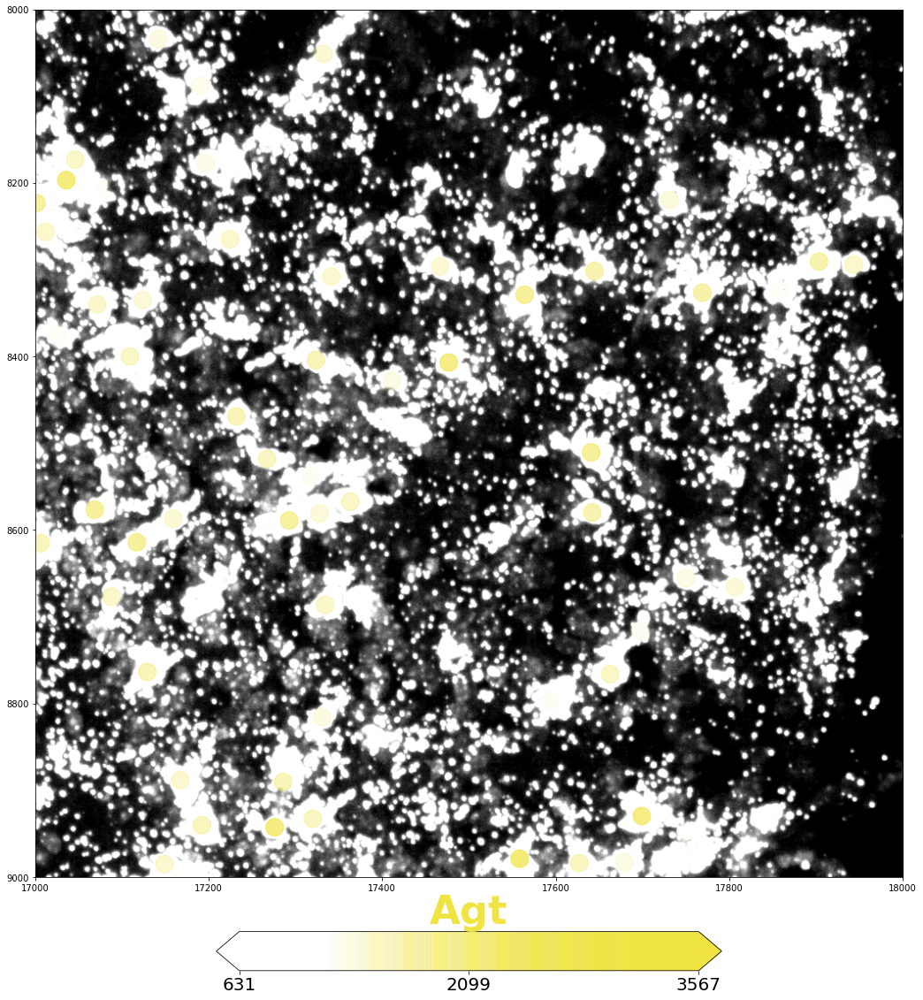

In [66]:
from cell2location.plt.mapping_video import plot_spatial

img_layer_agt = prepare_image(imgs, colored_segm_img=None, 
                                layer_num=2, alpha=0.5, 
                                resize_factor=None,
                                rescale_intensities=(150, 1000))

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(agt[['mean_intensity']], labels=['Agt'],
                  coords=agt[['centroid-1', 'centroid-0']].values, 
                  img=img_layer_agt, show_img=True, img_alpha=1,
                  circle_diameter=20, alpha_scaling=1, reorder_cmap=[0, 1],
                       plt_axis='on',
                  max_color_quantile=0.99, image_cmap='Greys_r',
                  crop_x=[1700 / resize_factor, 1800 / resize_factor], 
                  crop_y=[800 / resize_factor, 900 / resize_factor], 
                       axis_y_flipped=True,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

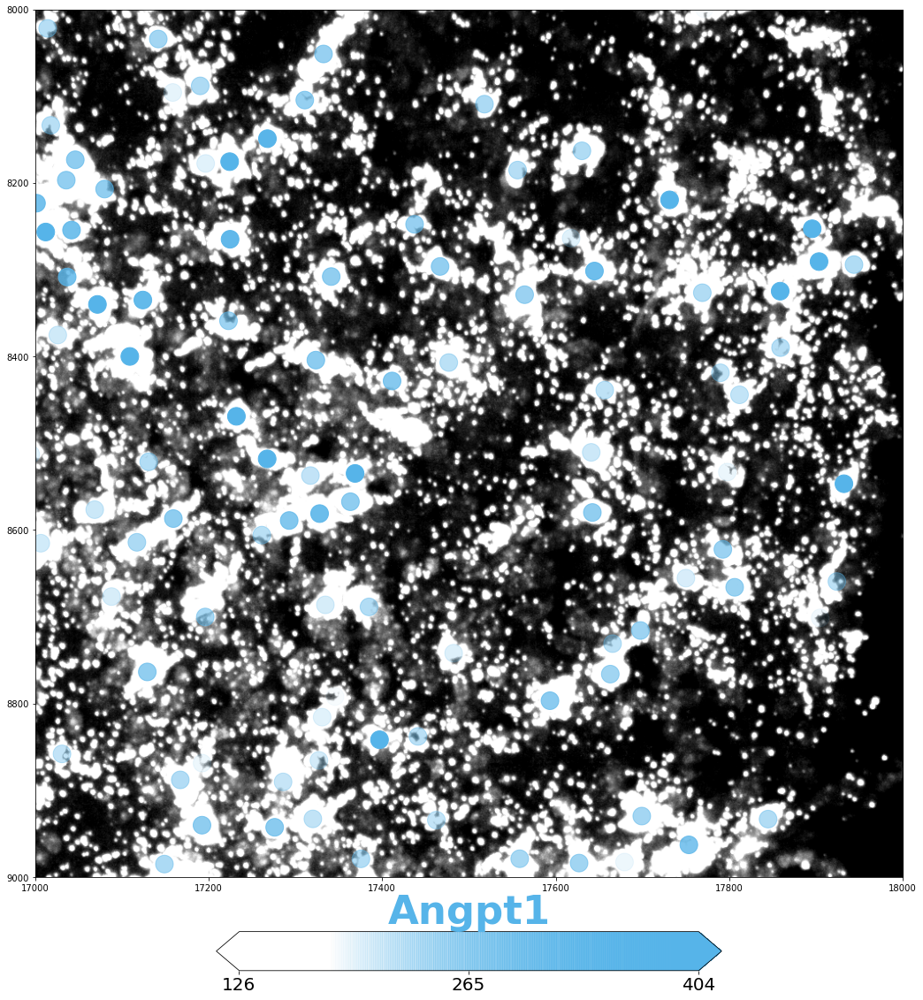

In [67]:
from cell2location.plt.mapping_video import plot_spatial

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(angpt1[['mean_intensity']], labels=['Angpt1'],
                  coords=angpt1[['centroid-1', 'centroid-0']].values, 
                  img=img_layer_agt, show_img=True, img_alpha=1,
                  circle_diameter=20, alpha_scaling=1, reorder_cmap=[2, 0, 1],
                       plt_axis='on',
                  max_color_quantile=0.99, image_cmap='Greys_r',
                  crop_x=[1700 / resize_factor, 1800 / resize_factor], 
                  crop_y=[800 / resize_factor, 900 / resize_factor], 
                       axis_y_flipped=True,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

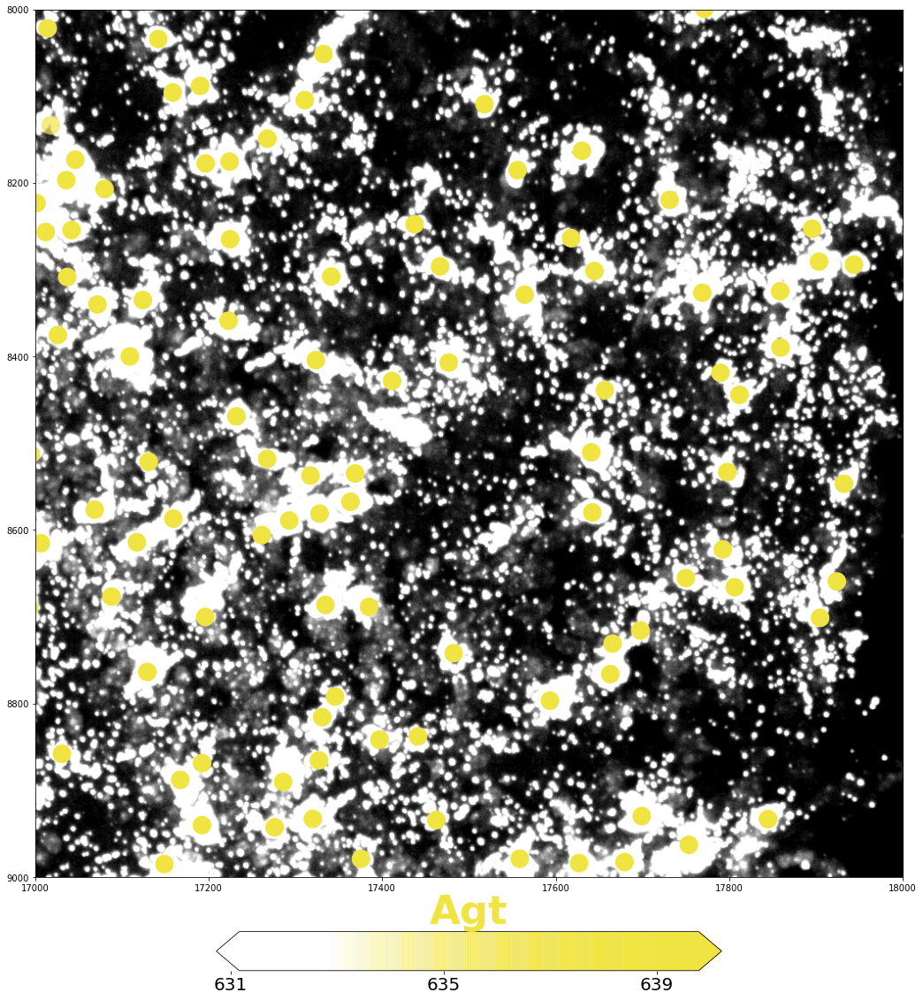

In [68]:
from cell2location.plt.mapping_video import plot_spatial

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(agt[['mean_intensity']], labels=['Agt'],
                  coords=agt[['centroid-1', 'centroid-0']].values, 
                  img=img_layer_agt, show_img=True, img_alpha=1,
                  circle_diameter=20, alpha_scaling=1, reorder_cmap=[0, 1],
                       plt_axis='on',
                  max_color_quantile=0.01, image_cmap='Greys_r',
                  crop_x=[1700 / resize_factor, 1800 / resize_factor], 
                  crop_y=[800 / resize_factor, 900 / resize_factor], 
                       axis_y_flipped=True,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

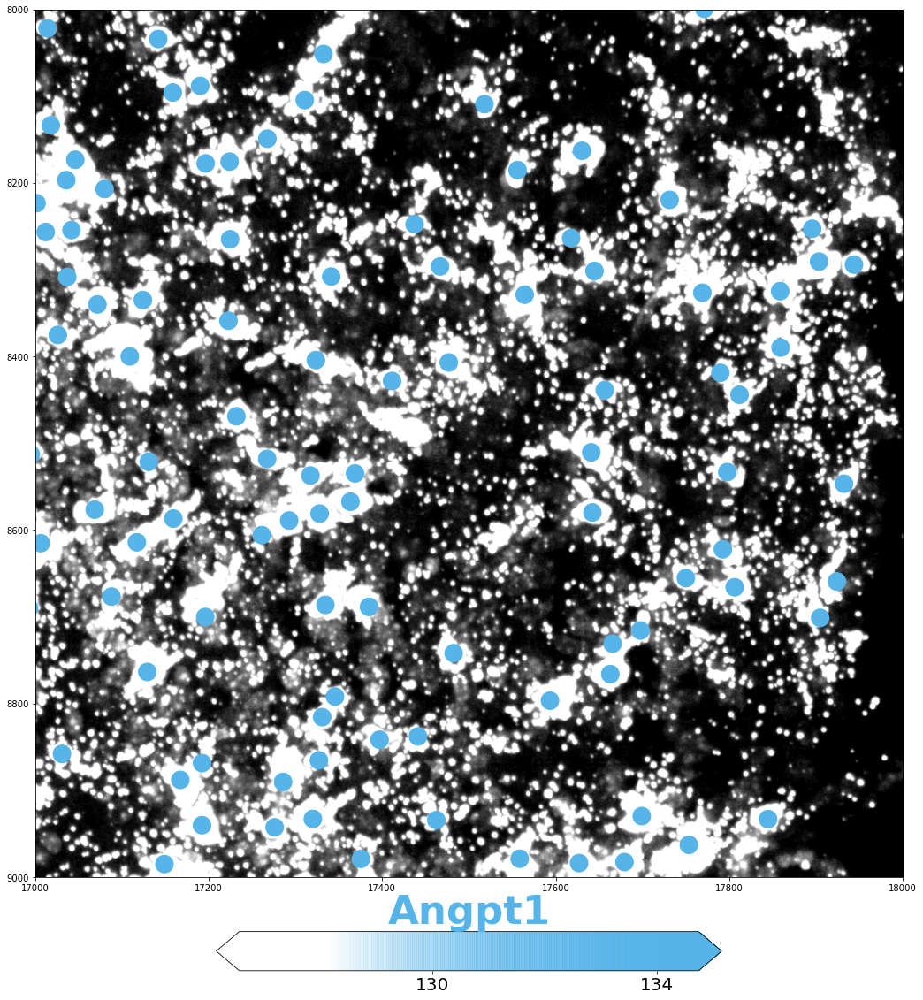

In [69]:
from cell2location.plt.mapping_video import plot_spatial

with matplotlib.rc_context({'axes.facecolor':  'white',
                            "figure.figsize": [20,20]}):
    fig = plot_spatial(angpt1[['mean_intensity']], labels=['Angpt1'],
                  coords=angpt1[['centroid-1', 'centroid-0']].values, 
                  img=img_layer_agt, show_img=True, img_alpha=1,
                  circle_diameter=20, alpha_scaling=1, reorder_cmap=[2, 0, 1],
                       plt_axis='on',
                  max_color_quantile=0.01, image_cmap='Greys_r',
                  crop_x=[1700 / resize_factor, 1800 / resize_factor], 
                  crop_y=[800 / resize_factor, 900 / resize_factor], 
                       axis_y_flipped=True,
                     colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 0.12, 'horizontal_gaps': 1, 
                                     'width': 3.5, 'height': 0.045},
                     colorbar_tick_size=20)

In [28]:
help(plot_spatial)

Help on function plot_spatial in module cell2location.plt.mapping_video:

plot_spatial(spot_factors_df, coords, text=None, circle_diameter=4, alpha_scaling=1, max_col=(inf, inf, inf, inf, inf, inf, inf), max_color_quantile=0.98, show_img=True, img=None, img_alpha=1, adjust_text=False, plt_axis='off', axis_y_flipped=True, x_y_labels=('', ''), crop_x=None, crop_y=None, text_box_alpha=0.9, reorder_cmap=range(0, 7), labels=None, style='fast', colorbar_position='bottom', colorbar_label_kw={}, colorbar_shape={}, colorbar_tick_size=12, colorbar_grid=None, image_cmap='Greys_r')
    Plot spatial abundance of cell types (regulatory programmes) with colour gradient and interpolation.
      This method supports only 7 cell types with these colours (in order, which can be changed using reorder_cmap).
      'yellow' 'orange' 'blue' 'green' 'purple' 'grey' 'white'
    :param spot_factors_df: pd.DataFrame - spot locations of cell types, only 6 cell types allowed
    :param coords: np.ndarray - x and y